In [5]:
# Install MediaPipe library, which offers tools for face landmark detection
!pip install mediapipe

   ---------------------------------------- 0.0/426.9 kB ? eta -:--:--
    --------------------------------------- 10.2/426.9 kB ? eta -:--:--
   -------- ------------------------------ 92.2/426.9 kB 880.9 kB/s eta 0:00:01
   ---------------------------------------  419.8/426.9 kB 2.9 MB/s eta 0:00:01
   ---------------------------------------- 426.9/426.9 kB 3.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.6
    Uninstalling protobuf-3.19.6:
      Successfully uninstalled protobuf-3.19.6


  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.11 requires protobuf<4,>=3.11, but you have protobuf 5.27.1 which is incompatible.
open-clip-torch 2.18.0 requires protobuf<4, but you have protobuf 5.27.1 which is incompatible.
tensorboard 2.10.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 5.27.1 which is incompatible.
tensorflow-gpu 2.10.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 5.27.1 which is incompatible.
tensorflow-serving-api 2.13.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 5.27.1 which is incompatible.


**Step 1 - Facial Landmark Extraction**

In [9]:
import os
import cv2
import pickle
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt

# Define a function to gather facial landmarks using MediaPipe's face mesh model
def gather_landmark_data(directory):
    # Initialize MediaPipe's face mesh module
    mp_face_mesh = mp.solutions.face_mesh
    mp_drawing = mp.solutions.drawing_utils
    face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, min_detection_confidence=0.5,min_tracking_confidence=0.5)

    # Dictionary to store the path of each image as the key and its landmarks as the value
    landmark_data = {}

    # Iterate over each class directory (e.g., different facial expressions)
    for class_name in os.listdir(directory):
        # Iterate over each image in the class directory
        for filename in os.listdir(os.path.join(directory, class_name)):
            img_path = os.path.join(directory, class_name, filename)
            # Read the image using OpenCV
            img = cv2.imread(img_path)
            # Convert the image from BGR to RGB format
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # Process the RGB image to get face landmarks
            results = face_mesh.process(img_rgb)

            # Check if landmarks are detected for the face in the image
            if results.multi_face_landmarks:
                landmarks = results.multi_face_landmarks[0]
                coords = []
                # Extract x, y, z coordinates for each landmark
                for landmark in landmarks.landmark:
                    coords.append((landmark.x, landmark.y, landmark.z))
                
                # Corner detection
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                gray = np.float32(gray)

                corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 10)
                corners = np.int0(corners)

                corner_coords = []
                for corner in corners:
                    x, y = corner.ravel()
                    corner_coords.append((x, y))
                    cv2.circle(img, (x, y), 3, 255, -1)

                # Find the maximum y-coordinate (optional)
                z = np.max(corners[:, 0, 1])
                cv2.circle(img, (x, z), 5, (0, 0, 255), -1)

                # Add the corner coordinates to the landmark data
                landmark_data[img_path] = {
                    'landmarks': coords,
                    'corners': corner_coords
                }
            else:
                # Print a message if no face is detected in the image
                print(f"No face detected in {img_path}. Skipping...")

    # Close the face mesh module
    face_mesh.close()
    return landmark_data

# Define a function to save the landmark data to a file using pickle
def save_landmark_data(landmark_data, filepath):
    with open(filepath, 'wb') as f:
        pickle.dump(landmark_data, f)

# Specify the directory containing the facial images
directory = 'D:\\BREATH\\OSA_FEI\\train'
# Gather landmarks for each image in the specified directory
landmark_data = gather_landmark_data(directory)

# Define the output path for the pickle file and save the landmark data
output_filepath = 'D:/BREATH/working/mp_landmark_data3_minconf5.pkl'
save_landmark_data(landmark_data, output_filepath)


No face detected in D:\BREATH\OSA_FEI\train\normal\10-10.jpg. Skipping...
No face detected in D:\BREATH\OSA_FEI\train\normal\6-10.jpg. Skipping...


**Step 2 - Data Training**

Fitting 3 folds for each of 108 candidates, totalling 324 fits
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=0.8, tree_method=hist; total time=   0.5s
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=0.8, tree_method=hist; total time=   0.4s
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=0.8, tree_method=hist; total time=   0.4s
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=1.0, tree_method=hist; total time=   0.4s
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=1.0, tree_method=hist; total time=   0.3s
[CV] END colsample_bytree=0.8, device=cuda, learning_rate=0.001, max_depth=3, n_estimators=100, subsample=1.0, tree_method=hist; total time=   0.4s
[CV] END colsample_bytree=0.8, device=cuda, learn

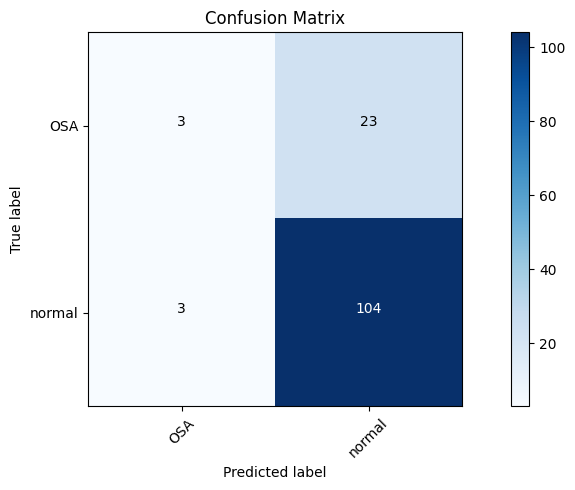

Classification Accuracy: 80.45%

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.12      0.19        26
           1       0.82      0.97      0.89       107

    accuracy                           0.80       133
   macro avg       0.66      0.54      0.54       133
weighted avg       0.76      0.80      0.75       133



In [10]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import itertools


# Function to load landmark data from a specified path
def load_data(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Convert the landmarks dictionary to data arrays and their corresponding labels
def convert_dict_to_arrays(data_dict):
    data = []
    labels = []
    for img_path, features in data_dict.items():
        # Flatten landmarks and corners, then concatenate
        landmarks = np.array(features['landmarks']).flatten()
        corners = np.array(features['corners']).flatten()
        combined_features = np.concatenate([landmarks, corners])
        
        data.append(combined_features)
        
        # Extract the disease label from the file path
        labels.append(img_path.split("\\")[-2])
    
    return np.asarray(data), np.asarray(labels)

# Split the dataset into training and testing sets
def split_data(data, labels, test_size=0.2):
    x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=test_size, shuffle=True, stratify=labels)
    return x_train, x_test, y_train, y_test

# Function to tune hyperparameters for the XGBoost model using GridSearch
def tune_hyperparameters(x_train, y_train):
    # Define possible values for hyperparameters
    param_grid = {
        'learning_rate': [0.001, 0.05, 0.1],
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'tree_method': ['hist'],# Use histogram-based method
        'device': ['cuda']  
    }

    xgb = XGBClassifier(objective='binary:logitraw', eval_metric='mlogloss', n_jobs=1, random_state=42)

    # Use GridSearchCV for finding the best hyperparameters
    grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid,
                               cv=3, n_jobs=1, verbose=2, scoring='accuracy',
                               error_score='raise')
    grid_search.fit(x_train, y_train)
    print("Best parameters found: ", grid_search.best_params_)
    print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
    return grid_search.best_estimator_

# Function to evaluate the model's performance on the test set
def evaluate_model(model, x_test, y_test):
    y_predict = model.predict(x_test)
    accuracy = accuracy_score(y_predict, y_test)
    report = classification_report(y_test, y_predict)
    matrix = confusion_matrix(y_test, y_predict)
    return accuracy, report, matrix

# Plot a confusion matrix to visualize the classification results
def plot_confusion_matrix(matrix, labels, title='Confusion Matrix'):
    plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)

    # Display the actual counts inside the matrix cells
    thresh = matrix.max() / 2.
    for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
        plt.text(j, i, format(matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if matrix[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()


# Display accuracy, confusion matrix, and classification report
def plot_metrics(matrix, labels, accuracy, report):
    plt.figure(figsize=(10,5))
    plot_confusion_matrix(matrix, labels)
    plt.show()
    print(f"Classification Accuracy: {accuracy*100:.2f}%")
    print("\nClassification Report:\n", report)

# Save the trained model to a specified path for future use
def save_model(model, file_path):
    with open(file_path, 'wb') as f:
        pickle.dump({'model': model}, f)

# Main execution begins here
try:
    # Load landmark data, convert to suitable format, and split into training and test sets
    data_dict = load_data('D:/BREATH/working/mp_landmark_data3_minconf5.pkl')
    data, labels = convert_dict_to_arrays(data_dict)
    label_encoder = LabelEncoder()
    labels_encoded = label_encoder.fit_transform(labels)
    label_classes = label_encoder.classes_
    x_train, x_test, y_train, y_test = split_data(data, labels_encoded)

    # Tune model, evaluate it, and save the trained model
    best_model = tune_hyperparameters(x_train, y_train)
    accuracy, report, matrix = evaluate_model(best_model, x_test, y_test)
    plot_metrics(matrix, label_classes, accuracy, report)
    save_model(best_model, 'D:/BREATH/working/mpneck_model2_conf5.p')

# Handle any errors or exceptions
except Exception as e:
    print("An error occurred:", str(e))


**Step 3 - Testing**

In [11]:
# Importing required modules
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2
import mediapipe as mp

# Load the pre-trained expression prediction model from the drive
def initialize_model():
    # Open and read the model file
    with open('D:/BREATH/working/mpneck_model2_conf5.p', 'rb') as f:
        model_data = pickle.load(f)
    # Return the loaded model
    return model_data['model']

# Set up the MediaPipe FaceMesh model with static_image_mode set to True
def initialize_mediapipe_facemesh():
    return mp.solutions.face_mesh.FaceMesh(static_image_mode=True)

# Predict the expression using an image and overlay landmarks on the image
def predict_expression(img_path, clf, facemesh, label_classes):
    # Read the image from the path
    img = cv2.imread(img_path)
    # Convert the image color space to RGB and process it with FaceMesh
    results = facemesh.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Check if any faces are detected in the image
    if not results.multi_face_landmarks:
        print(f"No face detected in {img_path}.")
        return

    # Create a copy of the image to overlay landmarks on it
    img_with_landmarks = img.copy()

    # List to store the extracted landmarks
    landmark_data = []
    for landmarks in results.multi_face_landmarks:
        for landmark in landmarks.landmark:
            # Calculate the landmark's x and y coordinates on the image
            x, y = int(landmark.x * img.shape[1]), int(landmark.y * img.shape[0])
            # Draw the landmark as a green circle on the image copy
            cv2.circle(img_with_landmarks, (x, y), 1, (0, 255, 0), -1)
            # Append the x, y, and z values of the landmark to the list
            landmark_data.extend([landmark.x, landmark.y, landmark.z])

    # Use the trained model to predict the expression using the landmarks
    prediction_index = clf.predict([landmark_data])[0]
    # Get the predicted label string using the label_classes list
    prediction_label = label_classes[prediction_index]
    # Calculate the confidence of the prediction
    confidence = np.max(clf.predict_proba([landmark_data]))
    # Map the prediction label to its corresponding expression name
    prediction_expression = prediction_label.capitalize()

    # Display the image with landmarks and prediction details
    display_result(img_with_landmarks, prediction_expression, confidence)

# Display the image with landmarks and expression prediction using matplotlib
def display_result(img_with_landmarks, prediction_expression, confidence):
    # Calculate dpi for a desired width of 500 pixels
    dpi = 550 / 6
    # Create a new figure with calculated dpi
    plt.figure(dpi=dpi)
    plt.imshow(cv2.cvtColor(img_with_landmarks, cv2.COLOR_BGR2RGB))
    # Set the title to show the predicted expression and confidence
   # plt.title(f"{prediction_expression} ({confidence*100:.2f}%)")
    plt.title(f"{prediction_expression}")
    # Hide the axis values
    plt.axis('off')
    # Show the image
    plt.show()

# Initialize the expression prediction model and the MediaPipe FaceMesh model
clf = initialize_model()
facemesh = initialize_mediapipe_facemesh()
label_classes = ['OSA', 'normal']

# Test the model using an image from the drive
predict_expression('D:/BREATH/OSA_crop/vali/OSA/3-01.jpg', clf, facemesh, label_classes)
predict_expression('D:\\BREATH\\IMG_7630.jpg', clf, facemesh, label_classes)
predict_expression('D:\\BREATH\\real_data_19062024\\front\\e54ccd1d-3b8b-4c62-9284-4809885cdeb4.jpeg', clf, facemesh, label_classes)


ValueError: Feature shape mismatch, expected: 1504, got 1404

['009531c7-d5c8-4472-92a7-8932669dac29.jpeg', '021704bd-be53-41e8-bace-b5105e13590c.jpeg', '02652579-7eb1-43a5-8920-dcc6bfdd17ec.jpeg', '0b57ab63-a737-4049-b8ee-5247433005f2.jpeg', '0e282e53-1a06-46e7-beae-cdfc5366bc4d.jpeg', '0ef44692-ed15-4224-8cd4-e034f36a57e5.jpeg', '17a148c0-84c0-47bc-9ab1-b665cb11fa6f.jpeg', '1a83d2da-bb74-42ad-ad6f-b630ee94c15d.jpeg', '1b9003e5-b01b-43d6-b8c3-2fdbf5819039.jpeg', '1cbc6870-3bff-4f67-88d3-81bde7fe7f8f.jpeg', '1ff7aa82-abf8-49d6-9c6c-9f19aa5feafb.jpeg', '2a61464b-54d8-460b-8c0e-b9cd58147e84.jpeg', '2a793127-0293-4367-9493-38f121485214.jpeg', '3108ad2d-40b2-469b-bfcb-b03db69dc106.jpeg', '373af1eb-2341-42a2-80db-06058219b1e3.jpeg', '3762e9a2-cab0-4720-ab06-15d45d38d8cb.jpeg', '39255e93-efa0-43e0-b51d-a86d2a162a17.jpeg', '39318c94-95ea-4c75-bba4-ad96a5d9f748.jpeg', '3aaea146-97d9-40cf-b248-edeff39fabf5.jpeg', '3e05ad3a-509d-4d0f-89e9-03272ed230fc.jpeg', '46785249-e608-412a-858a-d854a74a9421.jpeg', '480ea488-c70a-4798-a646-9445f3108c68.jpeg', '4d9cbc42

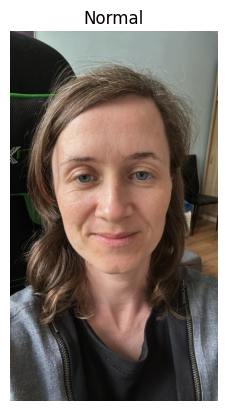

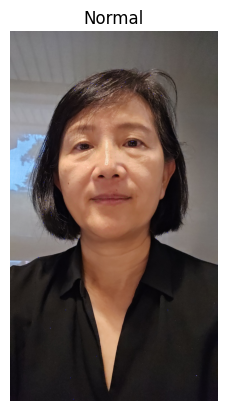

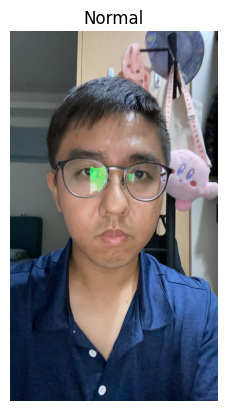

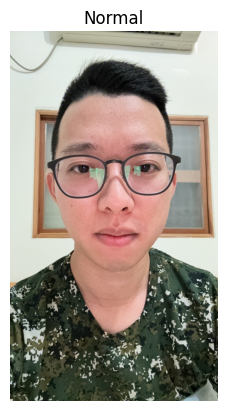

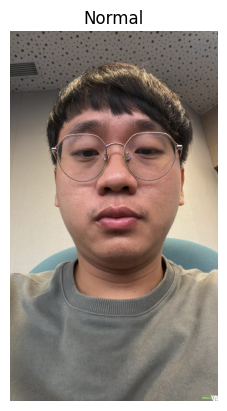

...

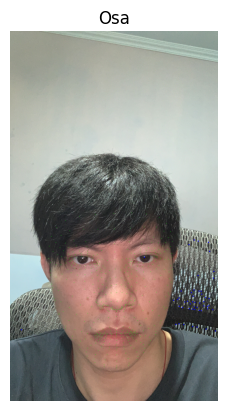

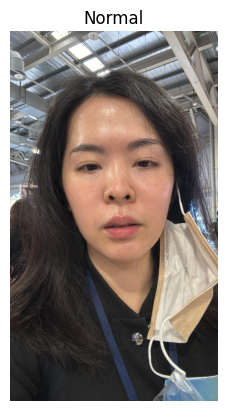

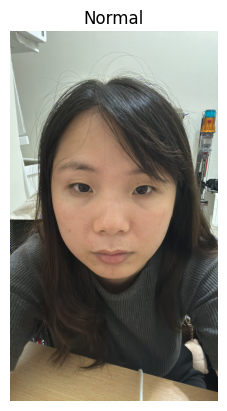

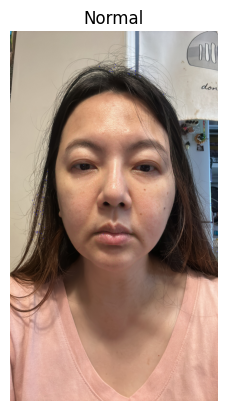

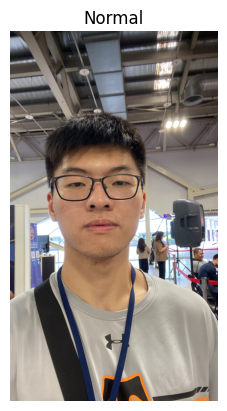

In [14]:
# Importing required modules
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2
import mediapipe as mp
import os
# Load the pre-trained expression prediction model from the drive
def initialize_model():
    # Open and read the model file
    with open('D:/BREATH/working/mp_model2_conf5.p', 'rb') as f:
        model_data = pickle.load(f)
    # Return the loaded model
    return model_data['model']

# Set up the MediaPipe FaceMesh model with static_image_mode set to True
def initialize_mediapipe_facemesh():
    return mp.solutions.face_mesh.FaceMesh(static_image_mode=True)

# Predict the expression using an image and overlay landmarks on the image
def predict_expression(img_path, clf, facemesh, label_classes):
    # Read the image from the path
    img = cv2.imread(img_path)
    # Convert the image color space to RGB and process it with FaceMesh
    results = facemesh.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Check if any faces are detected in the image
    if not results.multi_face_landmarks:
        print(f"No face detected in {img_path}.")
        return

    # Create a copy of the image to overlay landmarks and corners on it
    img_with_landmarks = img.copy()

    # List to store the extracted landmarks
    landmark_data = []
    for landmarks in results.multi_face_landmarks:
        for landmark in landmarks.landmark:
            # Calculate the landmark's x and y coordinates on the image
            x, y = int(landmark.x * img.shape[1]), int(landmark.y * img.shape[0])
            # Draw the landmark as a green circle on the image copy
            cv2.circle(img_with_landmarks, (x, y), 1, (0, 255, 0), -1)
            # Append the x, y, and z values of the landmark to the list
            landmark_data.extend([landmark.x, landmark.y, landmark.z])

    # Corner detection
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 10)
    corners = np.int0(corners)

    # List to store corner coordinates
    corner_data = []
    for corner in corners:
        x, y = corner.ravel()
        corner_data.extend([x / img.shape[1], y / img.shape[0]])  # Normalize corner coordinates
        # Draw the corner as a red circle on the image copy
        cv2.circle(img_with_landmarks, (x, y), 3, (255, 0, 0), -1)

    # Combine landmark and corner data
    combined_data = landmark_data + corner_data

    # Use the trained model to predict the expression using the combined landmarks and corners
    prediction_index = clf.predict([combined_data])[0]
    # Get the predicted label string using the label_classes list
    prediction_label = label_classes[prediction_index]
    # Calculate the confidence of the prediction
    confidence = np.max(clf.predict_proba([combined_data]))
    # Map the prediction label to its corresponding expression name
    prediction_expression = prediction_label.capitalize()

    # Display the image with landmarks, corners, and prediction details
    display_result(img_with_landmarks, prediction_expression, confidence)


# Display the image with landmarks and expression prediction using matplotlib
def display_result(img_with_landmarks, prediction_expression, confidence):
    # Calculate dpi for a desired width of 500 pixels
    #dpi = 550 / 6
    # Create a new figure with calculated dpi
    #plt.figure(dpi=dpi)
    plt.imshow(cv2.cvtColor(img_with_landmarks, cv2.COLOR_BGR2RGB))
    # Set the title to show the predicted expression and confidence
   # plt.title(f"{prediction_expression} ({confidence*100:.2f}%)")
    plt.title(f"{prediction_expression}")
    # Hide the axis values
    plt.axis('off')
    # Show the image
    print(img_with_landmarks)
    plt.show()

# Initialize the expression prediction model and the MediaPipe FaceMesh model
clf = initialize_model()
facemesh = initialize_mediapipe_facemesh()
label_classes = ['OSA', 'normal']
front = os.listdir('D:\\BREATH\\real_data_19062024\\front\\')
print(front)
# Test the model using an image from the drive
for i in front :
    predict_expression('D:\\BREATH\\real_data_19062024\\front\\'+i, clf, facemesh, label_classes)

#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0d03347c-727d-4b97-b279-6d080e445652.jpeg', clf, facemesh, label_classes)
#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0ab0952e-8767-4ae7-ad9a-3caf1ea6b8db.jpeg', clf, facemesh, label_classes)


In [12]:
# Importing required modules
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2
import mediapipe as mp
import os
# Load the pre-trained expression prediction model from the drive
def initialize_model():
    # Open and read the model file
    with open('D:/BREATH/working/mp_model2_conf5.p', 'rb') as f:
        model_data = pickle.load(f)
    # Return the loaded model
    return model_data['model']

# Set up the MediaPipe FaceMesh model with static_image_mode set to True
def initialize_mediapipe_facemesh():
    return mp.solutions.face_mesh.FaceMesh(static_image_mode=True)

# Predict the expression using an image and overlay landmarks on the image
def predict_expression(img_path, clf, facemesh, label_classes):
    # Read the image from the path
    img = cv2.imread(img_path)
    # Convert the image color space to RGB and process it with FaceMesh
    results = facemesh.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Check if any faces are detected in the image
    if not results.multi_face_landmarks:
        print(f"No face detected in {img_path}.")
        return

    # Create a copy of the image to overlay landmarks and corners on it
    img_with_landmarks = img.copy()

    # List to store the extracted landmarks
    landmark_data = []
    for landmarks in results.multi_face_landmarks:
        for landmark in landmarks.landmark:
            # Calculate the landmark's x and y coordinates on the image
            x, y = int(landmark.x * img.shape[1]), int(landmark.y * img.shape[0])
            # Draw the landmark as a green circle on the image copy
            cv2.circle(img_with_landmarks, (x, y), 1, (0, 255, 0), -1)
            # Append the x, y, and z values of the landmark to the list
            landmark_data.extend([landmark.x, landmark.y, landmark.z])

    # Corner detection
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 10)
    corners = np.int0(corners)

    # List to store corner coordinates
    corner_data = []
    for corner in corners:
        x, y = corner.ravel()
        corner_data.extend([x / img.shape[1], y / img.shape[0]])  # Normalize corner coordinates
        # Draw the corner as a red circle on the image copy
        cv2.circle(img_with_landmarks, (x, y), 3, (255, 0, 0), -1)

    # Combine landmark and corner data
    combined_data = landmark_data + corner_data

    # Use the trained model to predict the expression using the combined landmarks and corners
    prediction_index = clf.predict([combined_data])[0]
    # Get the predicted label string using the label_classes list
    prediction_label = label_classes[prediction_index]
    # Calculate the confidence of the prediction
    confidence = np.max(clf.predict_proba([combined_data]))
    # Map the prediction label to its corresponding expression name
    prediction_expression = prediction_label.capitalize()

    # Display the image with landmarks, corners, and prediction details
    display_result(img_with_landmarks, prediction_expression, confidence)


# Display the image with landmarks and expression prediction using matplotlib
def display_result(img_with_landmarks, prediction_expression, confidence):
    # Calculate dpi for a desired width of 500 pixels
    #print(img_with_landmarks)
    #dpi = 550 / 6
    # Create a new figure with calculated dpi
    #plt.figure(dpi=dpi)
    out = plt.imshow(cv2.cvtColor(img_with_landmarks, cv2.COLOR_BGR2RGB))
    # Set the title to show the predicted expression and confidence
   # plt.title(f"{prediction_expression} ({confidence*100:.2f}%)")
    plt.title(f"{prediction_expression}")
    # Hide the axis values
    plt.axis('off')
    # Show the image
    plt.savefig('D:\\BREATH\\working\\false\\'+name)
    plt.show()
    #plt.savefig('D:\\BREATH\\working\\false\\'+out)
    #return out

# Initialize the expression prediction model and the MediaPipe FaceMesh model
clf = initialize_model()
facemesh = initialize_mediapipe_facemesh()
label_classes = ['OSA', 'normal']
front = os.listdir('D:\\BREATH\\real_data_19062024\\false\\')
#print(front)
# Test the model using an image from the drive
for i in front :
    print(i)
    out = predict_expression('D:\\BREATH\\real_data_19062024\\false\\'+i, clf, facemesh, label_classes,i)
    #out.savefig('D:\\BREATH\\working\\false\\'+i+'.png')

#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0d03347c-727d-4b97-b279-6d080e445652.jpeg', clf, facemesh, label_classes)
#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0ab0952e-8767-4ae7-ad9a-3caf1ea6b8db.jpeg', clf, facemesh, label_classes)


0d18691a-c350-4917-90b4-80fb00b46dd6.jpeg


TypeError: predict_expression() takes 4 positional arguments but 5 were given

['0ab0952e-8767-4ae7-ad9a-3caf1ea6b8db.jpeg', '0d03347c-727d-4b97-b279-6d080e445652.jpeg', '13b1bc39-26a1-4eff-99c3-6637179428c6.jpeg', '1a02c3b7-eb15-4c43-91a5-929113462639.jpeg', '30b0df0c-990f-4bf3-8bf7-68180c8a23f6.jpeg', '3e77df6b-6e46-4afd-be1c-7517810d66d2.jpeg', '40479399-e4da-454e-96ef-419001230c37.jpeg', '53ed4281-62f3-4a36-ac00-be14ca97f638.jpeg', '636377fd-6e01-4f08-a0db-c724004919b1.jpeg', '6973e510-327d-45eb-993c-dd80b4f2f6de.jpeg', '6d25efc9-0aef-4b78-8287-b97b87b8e3c0.jpeg', '7441c418-1173-4792-80db-1a2ec1fdc275.jpeg', '823c942f-5111-465c-8442-2aa73869488d.jpeg', '87280e0f-a6b2-433e-88a6-54b1616d74fa.jpeg', '8c5d737d-8ad4-4c70-948f-726a9d364851.jpeg', '8d39cebc-ca15-4e51-bbaa-17f7bfd7f95c.jpeg', '90464d5a-5b9c-4b40-9308-5855380b83f1.jpeg', '9097088c-e38c-4d83-b43e-0c1b1721f28c.jpeg', '98fd5a4f-8656-41c9-b60b-ba5bef2ed53c.jpeg', '9b1d2dc7-cc83-491c-b419-a608b9ee520c.jpeg', '9e429698-264b-484e-8421-36de6f815699.jpeg', 'a1fbf874-93cb-4add-aa8c-b682084b93e1.jpeg', 'a5a71fa8

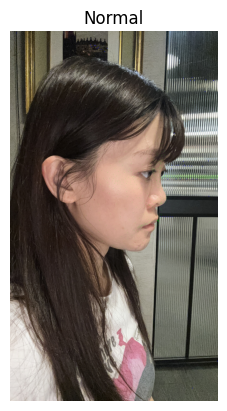

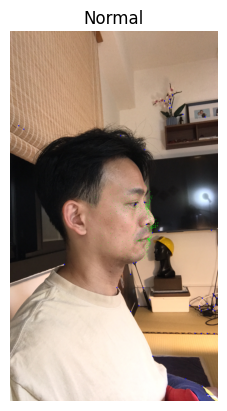

No face detected in D:\BREATH\real_data_19062024\profile\13b1bc39-26a1-4eff-99c3-6637179428c6.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\1a02c3b7-eb15-4c43-91a5-929113462639.jpeg.


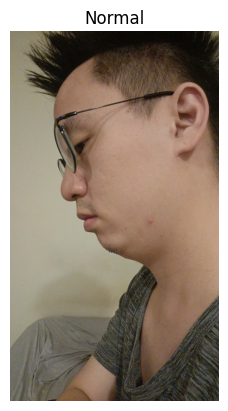

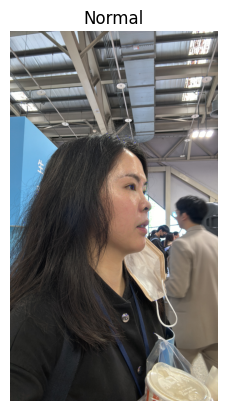

No face detected in D:\BREATH\real_data_19062024\profile\40479399-e4da-454e-96ef-419001230c37.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\53ed4281-62f3-4a36-ac00-be14ca97f638.jpeg.


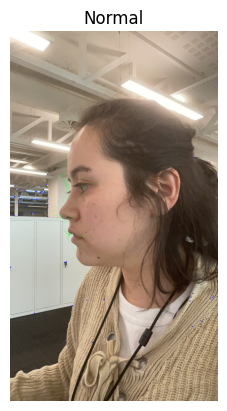

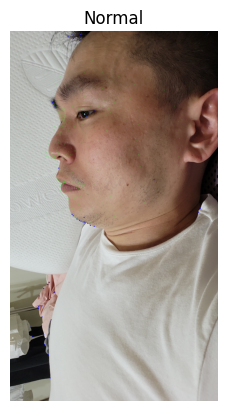

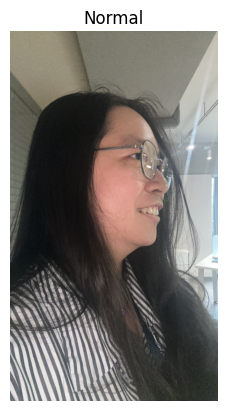

No face detected in D:\BREATH\real_data_19062024\profile\7441c418-1173-4792-80db-1a2ec1fdc275.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\823c942f-5111-465c-8442-2aa73869488d.jpeg.


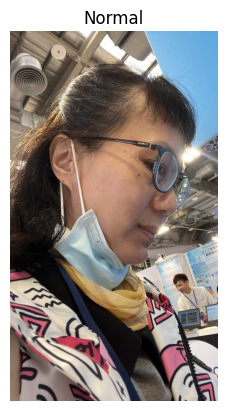

No face detected in D:\BREATH\real_data_19062024\profile\8c5d737d-8ad4-4c70-948f-726a9d364851.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\8d39cebc-ca15-4e51-bbaa-17f7bfd7f95c.jpeg.


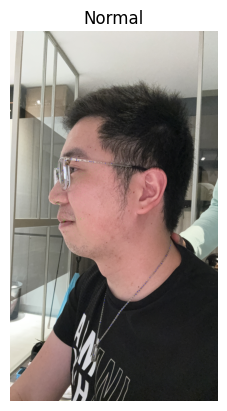

No face detected in D:\BREATH\real_data_19062024\profile\9097088c-e38c-4d83-b43e-0c1b1721f28c.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\98fd5a4f-8656-41c9-b60b-ba5bef2ed53c.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\9b1d2dc7-cc83-491c-b419-a608b9ee520c.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\9e429698-264b-484e-8421-36de6f815699.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\a1fbf874-93cb-4add-aa8c-b682084b93e1.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\a5a71fa8-0056-42ed-87b0-4b80f49b1a5f.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\a7421681-7736-4fdc-9deb-237df04b154b.jpeg.


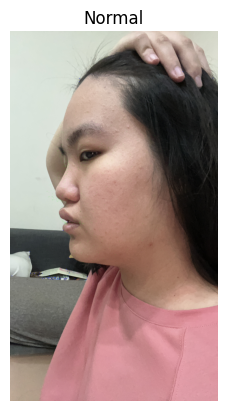

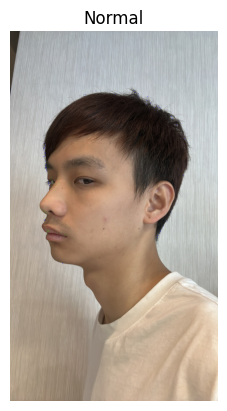

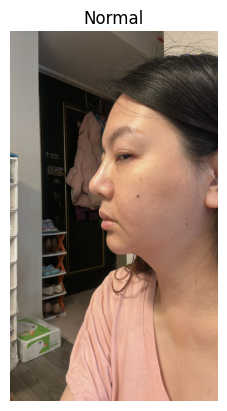

No face detected in D:\BREATH\real_data_19062024\profile\c8c92309-99ab-48e8-81ac-28c1ba35bfe6.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\cda8986e-9098-442c-b526-e24cbf669e93.jpeg.


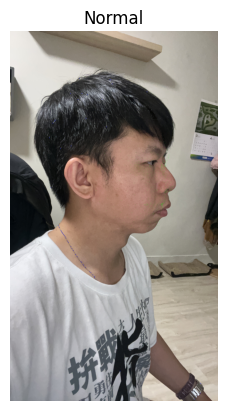

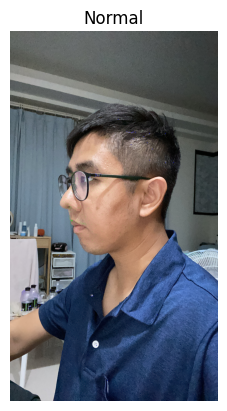

No face detected in D:\BREATH\real_data_19062024\profile\ec43a703-739c-48b2-b943-b7cd054f2403.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\ed95ae88-0ffa-413c-bdab-0425c4370285.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\f58d343c-0f63-4e78-b9c2-f3b68b7aae95.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\fb9a7704-fc94-41e2-b3b5-5b5d374710eb.jpeg.
No face detected in D:\BREATH\real_data_19062024\profile\fc2bd386-4977-4ad2-b42f-fb8154897b8c.jpeg.


In [7]:
# Importing required modules
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2
import mediapipe as mp
import os
# Load the pre-trained expression prediction model from the drive
def initialize_model():
    # Open and read the model file
    with open('D:/BREATH/working/mp_model2_conf5.p', 'rb') as f:
        model_data = pickle.load(f)
    # Return the loaded model
    return model_data['model']

# Set up the MediaPipe FaceMesh model with static_image_mode set to True
def initialize_mediapipe_facemesh():
    return mp.solutions.face_mesh.FaceMesh(static_image_mode=True)

# Predict the expression using an image and overlay landmarks on the image
def predict_expression(img_path, clf, facemesh, label_classes):
    # Read the image from the path
    img = cv2.imread(img_path)
    # Convert the image color space to RGB and process it with FaceMesh
    results = facemesh.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Check if any faces are detected in the image
    if not results.multi_face_landmarks:
        print(f"No face detected in {img_path}.")
        return

    # Create a copy of the image to overlay landmarks and corners on it
    img_with_landmarks = img.copy()

    # List to store the extracted landmarks
    landmark_data = []
    for landmarks in results.multi_face_landmarks:
        for landmark in landmarks.landmark:
            # Calculate the landmark's x and y coordinates on the image
            x, y = int(landmark.x * img.shape[1]), int(landmark.y * img.shape[0])
            # Draw the landmark as a green circle on the image copy
            cv2.circle(img_with_landmarks, (x, y), 1, (0, 255, 0), -1)
            # Append the x, y, and z values of the landmark to the list
            landmark_data.extend([landmark.x, landmark.y, landmark.z])

    # Corner detection
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 10)
    corners = np.int0(corners)

    # List to store corner coordinates
    corner_data = []
    for corner in corners:
        x, y = corner.ravel()
        corner_data.extend([x / img.shape[1], y / img.shape[0]])  # Normalize corner coordinates
        # Draw the corner as a red circle on the image copy
        cv2.circle(img_with_landmarks, (x, y), 3, (255, 0, 0), -1)

    # Combine landmark and corner data
    combined_data = landmark_data + corner_data

    # Use the trained model to predict the expression using the combined landmarks and corners
    prediction_index = clf.predict([combined_data])[0]
    # Get the predicted label string using the label_classes list
    prediction_label = label_classes[prediction_index]
    # Calculate the confidence of the prediction
    confidence = np.max(clf.predict_proba([combined_data]))
    # Map the prediction label to its corresponding expression name
    prediction_expression = prediction_label.capitalize()

    # Display the image with landmarks, corners, and prediction details
    display_result(img_with_landmarks, prediction_expression, confidence)


# Display the image with landmarks and expression prediction using matplotlib
def display_result(img_with_landmarks, prediction_expression, confidence):
    # Calculate dpi for a desired width of 500 pixels
    #dpi = 550 / 6
    # Create a new figure with calculated dpi
    #plt.figure(dpi=dpi)
    plt.imshow(cv2.cvtColor(img_with_landmarks, cv2.COLOR_BGR2RGB))
    # Set the title to show the predicted expression and confidence
   # plt.title(f"{prediction_expression} ({confidence*100:.2f}%)")
    plt.title(f"{prediction_expression}")
    # Hide the axis values
    plt.axis('off')
    # Show the image
    plt.show()

# Initialize the expression prediction model and the MediaPipe FaceMesh model
clf = initialize_model()
facemesh = initialize_mediapipe_facemesh()
label_classes = ['OSA', 'normal']
front = os.listdir('D:\\BREATH\\real_data_19062024\\profile\\')
print(front)
# Test the model using an image from the drive
for i in front :
    predict_expression('D:\\BREATH\\real_data_19062024\\profile\\'+i, clf, facemesh, label_classes)

#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0d03347c-727d-4b97-b279-6d080e445652.jpeg', clf, facemesh, label_classes)
#predict_expression('D:\\BREATH\\real_data_19062024\\profile\\0ab0952e-8767-4ae7-ad9a-3caf1ea6b8db.jpeg', clf, facemesh, label_classes)
